# Unrolling Tutorial

We use mouse brain and mouse small intestine data, which are single-cell adata objects obtained directly from segmentation analysis.

### Dataset Information

Access the dataset here: [Visium HD CytAssist Gene Expression Libraries of Mouse Brain(FFPE)](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-of-mouse-brain-he) and [Visium HD Spatial Gene Expression Library, Mouse Small Intestine (FFPE)](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-of-mouse-intestine)


The unrolling process mainly consists of two parts: 1) finding the x-axis and then obtaining the y-axis. In the first part, we use the previous cluster results to determine and find the cluster representing the x-axis. In the second part, we proceed to unwrap the y-axis using two different methods. The first method is to use the straight-line distance of each cell from the x-axis (as in the mouse brain example). 2) The second method is to use a relative distance, where each cell must be connected to another cell, resulting in a one-by-one distance to the x-axis (as in the mouse small intestine data). The choice of method depends on the specific dataset—generally, naturally formed loops use the first method, while artificially formed loops from experiments use the second method.

Particularly, the first part mainly contains 3 steps:

1. Delete cells that are clearly not on the x-axis.
2. Cells on the x-axis, but in the beginning or end segments, which may be fragmented due to experimental reasons, need to be kept separately.
3. Unroll x-axis by locally linear embedding.


Main functions for unwrolling contains:

1. [su.select_cells()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.select_cells()): to select the cells from the boundary cluster for the x-axis. [su.select_cells()]
2. [su.clean_select()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.clean_select()): to clean the selected.
3. [su.x_axis()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.x_axis()-and-su.x_axis_pre()) and [su.x_axis_pre()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.x_axis()-and-su.x_axis_pre()): to build the x-axis.
5. [su.select_rest_cells()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.select_rest_cells()): to find all remaining cells for the y-axis.
6. [su.y_axis()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.y_axis()) and [su.y_axis_circle()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.y_axis_circle()) to get the final y-axis results.
   
In the meantime, we can use `su.plot_selected()` to view our data and `su.plot_final_result()` to take a look at the final results.

For how to use SMURF to achieve your desired results, please refer to the examples. Thank you.

In [1]:
import scanpy as sc
import numpy as np
import smurf as su
import pandas as pd
import matplotlib.pyplot as plt

> **Note on software versions**
>
> This tutorial was developed and tested with the exact package versions listed below.  
> Using these versions should reproduce the results exactly.  
> Newer releases may introduce subtle differences.  
> If you encounter any issues, please open an issue on our [GitHub repository](https://github.com/The-Mitra-Lab/SMURF/issues) and we’ll respond as soon as possible. Thanks!

| Package        | Version        |
|----------------|----------------|
| numpy          | 1.26.4         |
| pandas         | 1.5.3          |
| tqdm           | 4.66.2         |
| scanpy         | 1.10.0         |
| scipy          | 1.12.0         |
| matplotlib     | 3.8.3          |
| numba          | 0.59.0         |
| scikit-learn   | 1.4.1.post1    |
| Pillow         | 10.2.0         |
| anndata        | 0.10.6         |
| h5py           | 3.10.0         |
| pyarrow        | 16.1.0         |
| igraph         | 0.11.5         |

Here are the python codes you can use to install the exact versions:
```python
import importlib.metadata as metadata
import subprocess
import sys

# Dictionary of desired package versions
desired_versions = {
    "numpy": "1.26.4",
    "pandas": "1.5.3",
    "tqdm": "4.66.2",
    "scanpy": "1.10.0",
    "scipy": "1.12.0",
    "matplotlib": "3.8.3",
    "numba": "0.59.0",
    "scikit-learn": "1.4.1.post1",
    "Pillow": "10.2.0",
    "anndata": "0.10.6",
    "h5py": "3.10.0",
    "pyarrow": "16.1.0",
    "igraph": "0.11.5",
}

for pkg, target_ver in desired_versions.items():
    try:
        installed_ver = metadata.version(pkg)
    except metadata.PackageNotFoundError:
        installed_ver = None

    if installed_ver != target_ver:
        print(f"{pkg} current version: {installed_ver or 'not installed'}, installing/upgrading to {target_ver}…")
        subprocess.run(
            [sys.executable, "-m", "pip", "install", f"{pkg}=={target_ver}"],
            check=True
        )
    else:
        print(f"{pkg} is already at version {target_ver}, no action needed.")
```


# Unrolling Mouse Brain Data

Let's first start with the mouse brain example.

To download the final result directly:
``` python
! wget https://github.com/The-Mitra-Lab/SMURF/releases/download/datasets/adata_sc_final_mousebrain.h5ad.gz
! gunzip adata_sc_final_mousebrain.h5ad.gz 
```

In [2]:
#! wget https://github.com/The-Mitra-Lab/SMURF/releases/download/datasets/adata_sc_final_mousebrain.h5ad.gz
#! gunzip adata_sc_final_mousebrain.h5ad.gz 

In [3]:
adata_sc_final_mousebrain = sc.read_h5ad('adata_sc_final_mousebrain.h5ad')
adata_sc_final_mousebrain

AnnData object with n_obs × n_vars = 56859 × 19059
    obs: 'cell_cluster', 'cos_simularity', 'cell_size', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types'
    uns: 'spatial'
    obsm: 'spatial'

### su.select_cells()

`su.select_cells(adata, cluster, cluster_name='cell_cluster', spatial_name=['array_row', 'array_col'] , so=None)`

1. `adata`: Input your adata object.
2. `cluster`: Provide a list of clusters to be included.
3. `cluster_name`: Specify the name of the cluster in adata.obs.
4. `spatial_name`: A list of two strings specifying the names of the columns in `adata.obs` that contain the spatial coordinates. Defaults to `['array_row', 'array_col']` from SMURF soft segmentation.
5. `so`: If `spatial_name` are not in adata.obs, please input your `so` (spatial object) from the previous analysis.

The output of the selected data is a list containing two numpy arrays. The first array includes all the cell IDs selected, and the second array contains the coordinates of the corresponding cells.

In this example, we want to use cluster 13 to build the x-axis.

In [4]:
selected_mousebrain = su.select_cells(adata_sc_final_mousebrain, [13], cluster_name = 'cell_cluster')

Take a look at your data here.

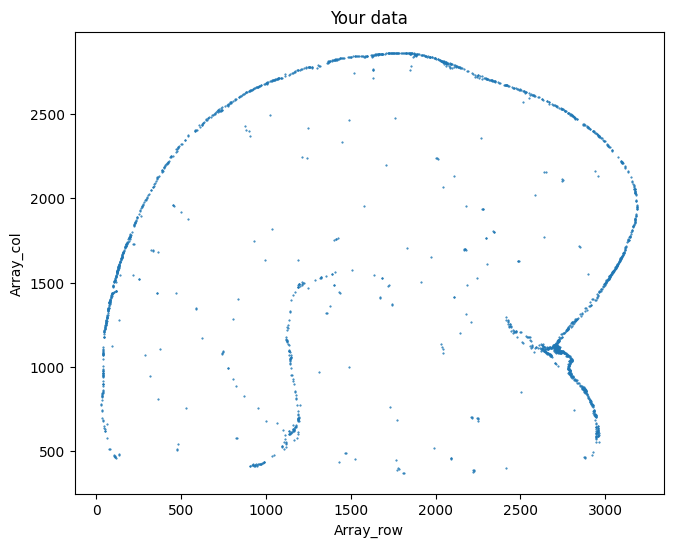

In [5]:
su.plot_selected(selected_mousebrain)

### su.clean_select() 

`su.clean_select(selected, left=None, right=None, up=None, down=None, outlier_cutoff=20, outlier_neighbors=6, delete_xaxis=[np.array([]), np.zeros((0, 2))], return_deleted=False, save_area=[None, None, None, None], k_neighbors=40, avg_iterations=1)`

1. `selected`: Please input your selected data.
2. **Delete cells directly** `left`, `right`, `up`, `down`: We will delete all cells in these areas.
3. **Delete outliers** `outlier_cutoff`, `outlier_neighbors`, `k_neighbors`, `avg_iterations`: We will delete outliers that meet these criteria. Here, we first add points by averaging iterations (`avg_iterations`) with k neighbors (`k_neighbors`) to get denser cells. Then, we use k-nearest neighbors (k = `outlier_neighbors`) to find the distance between each cell and its neighbors, deleting the cell if the distance is larger than `outlier_cutoff`.
4. **Secure area** `save_area`: We will save all the cells in this area; these four values represent [`left`, `right`, `up`, `down`].
5. `delete_xaxis`, `return_deleted`=`False`: In some cases, there are data points on the x-axis, but they are disconnected due to certain reasons, making it impossible to determine the x-axis. We need to delete these points during analysis, but we need to save them as they originally belonged to the x-axis (please see the mouse intestine example for more details, but for now, you may ignore this part).


The output of this function includes the new selected data and to_delete (only if `return_deleted`=`True`).

**Since assigning a value to the output will modify `selected`, please confirm the parameters before making any actual changes.**


For these analysis please do:

```python
su.clean_select(selected_mousebrain, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                down=None, up = 2000, right=3160, left=300,
                save_area = [0,400,600,400], return_deleted=False, 
                outlier_cutoff = 25, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)

```
first. And find the best parameters. Then do:

```python
selected_mousebrain = su.clean_select(selected_mousebrain, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                      down=None, up = 2000, right=3160, left=300, 
                                      save_area = [0,400,600,400],return_deleted=False, 
                                      outlier_cutoff = 25, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)
```
to delete the cells.

You can always perform this multiple times to prepare the best data for x-axis analysis.

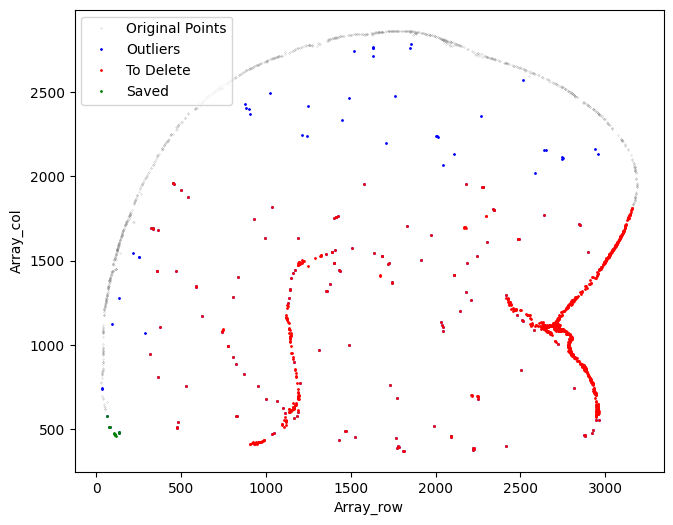

In [6]:
selected_mousebrain = su.clean_select(selected_mousebrain, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                      down=None, up = 2000, right=3160, left=300,
                                      save_area = [0,400,600,400],return_deleted=False, 
                                      outlier_cutoff = 20, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)

### su.x_axis() and su.x_axis_pre() 

We Use [LocallyLinearEmbedding](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.LocallyLinearEmbedding.html) for unwrapping x axis.

`su.x_axis(selected, adata, so=None, seed=42, n_neighbors=50, num_avg=35, unit=5, resolution=2, spatial_name=['array_row', 'array_col'])`

1. `selected`: The selected cells from previous analysis.
2. `adata` and `so`: The adata object. Same as in su.select_cells(). If `'x'` and `'y'` are not in adata.obs, please input your `so` (spatial object) from the previous analysis.
3. `seed`: A random seed.
4. `n_neighbors`: The number of neighbors for LocallyLinearEmbedding.
5. `num_avg=35`, `unit = 5`: After obtaining the final results, we smooth the data and calculate an axis with even intervals. Typically, we smooth over `num_avg` consecutive cells. You can also specify unit size on the x-axis. If not specified, we will use a default unit value equivalent to a 5 μm x-axis in the real world. 
6. `resolution`: Input resolution of sequencing tech, for VisuimHD is 2 um.
7. `spatial_name`: A list of two strings specifying the names of the columns in `adata.obs` that contain the spatial coordinates. Defaults to `['array_row', 'array_col']` from SMURF soft segmentation.

The output of this function is a units_number * 2 numpy array representing the x-axis.
   
`x_axis_pre(selected, seed=42, n_neighbors=50, spatial_name=['array_row', 'array_col'])`

This function is the same as `x_axis()`, but it only completes the first step. You should use this function first to confirm the values for `seed` and `n_neighbors`, then use `x_axis()` to obtain the final results.


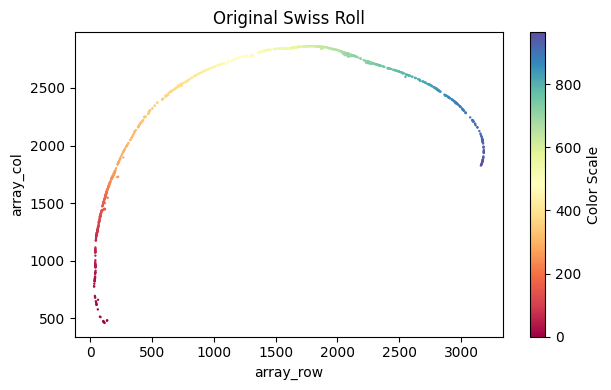

In [7]:
su.x_axis_pre(selected_mousebrain, seed=42, n_neighbors=50)

Make sure the unwrapping looks good here. Then, we will create the x-axis.

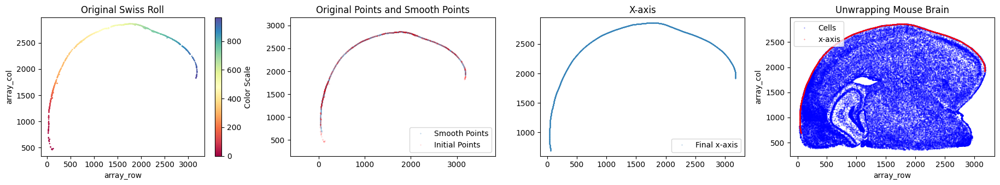

One unit length on the x-axis is 5.00 μm. The total x-axis length is 0.9959 cm.


In [8]:
x_axis_results_mousebrain = su.x_axis(selected_mousebrain, adata_sc_final_mousebrain)

### su.select_rest_cells()

`su.select_rest_cells(adata, selected=None, delete_xaxis=None, spatial_name=['array_row', 'array_col'], so=None,)`

The function will give you all the rest cells except for selected and delete_xaxis.

1. `adata`: Input your adata object.
2. `selected`: In put your selected data.
3. `delete_xaxis`: Input your data that is part of the x-axis but not included in the x-axis results (see the small intestine example).
4. `cluster`: Provide a list of clusters to be included.
5. `spatial_name`: A list of two strings specifying the names of the columns in `adata.obs` that contain the spatial coordinates. Defaults to `['array_row', 'array_col']` from SMURF soft segmentation.
6. `so`: If `spatial_name` are not in adata.obs, please input your `so` (spatial object) from the previous analysis.


The output of this function includes all the cells that are not in `selected `or `delete_xaxis`, in the same format as `selected`.

In [9]:
cells_mousebrain = su.select_rest_cells(adata_sc_final_mousebrain, selected_mousebrain)

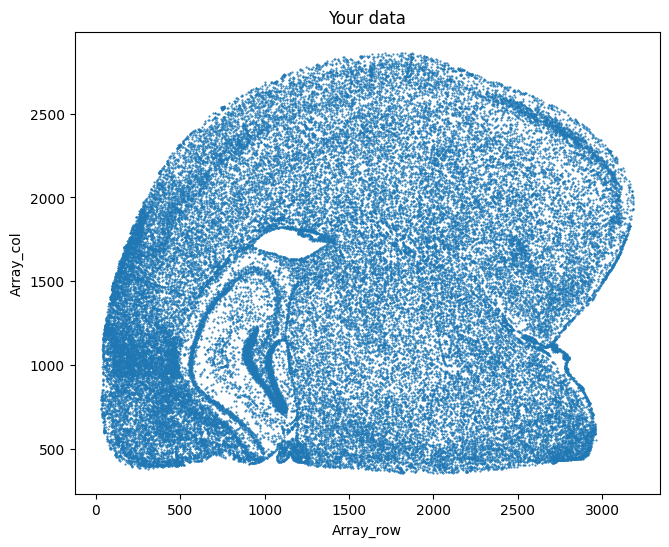

In [10]:
su.plot_selected(cells_mousebrain)

### su.y_axis()

`su.y_axis(x_axis, cells, selected=None, delete_xaxis=[[np.zeros((0, 1))],np.zeros((0, 2))], unit=5, resolution=2, center = None, spatial_name = ['array_row', 'array_col'])`

We use this function to unroll the y-axis using the straight-line distance.

1. `x_axis`: Input your x_axis_results.
2. `cells`: Input your cells for y-axis unrolling.
3. `selected`: Input your selected cells for the x-axis. For all cells here, the y value will automatically be set to 0.
4. `delete_xaxis`:  Input your data that is part of the x-axis but not included in the x-axis results (see the small intestine example).
5. `unit`: Input a unit value representing how many µm it corresponds to on the x-axis. 
6. `resolution`: Input resolution of sequencing tech, for VisuimHD is 2 um.
7. `center`: The center for reference, if not `None`, it requires the direction from each cell to the x-axis must match the direction from the cell to the center. Please input a 1*2 numpy array, eg: `center = np.array([1750,1600])`.
8. `spatial_name`: A list of two strings specifying the names of the columns in `adata.obs` that contain the spatial coordinates. Defaults to `['array_row', 'array_col']` from SMURF soft segmentation.

The output of this function is a pandas array of the cells and their information. You can directly concatenate it to `adata.obs` if desired.

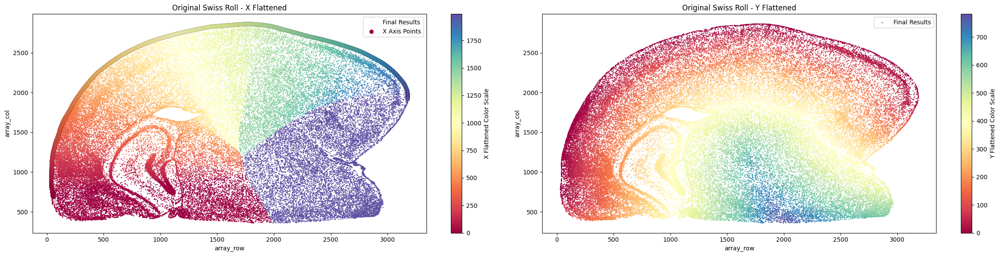

In [11]:
final_result_mousebrain = su.y_axis(x_axis_results_mousebrain, cells_mousebrain, selected_mousebrain)

Finally, filter for the part you want and take a look!

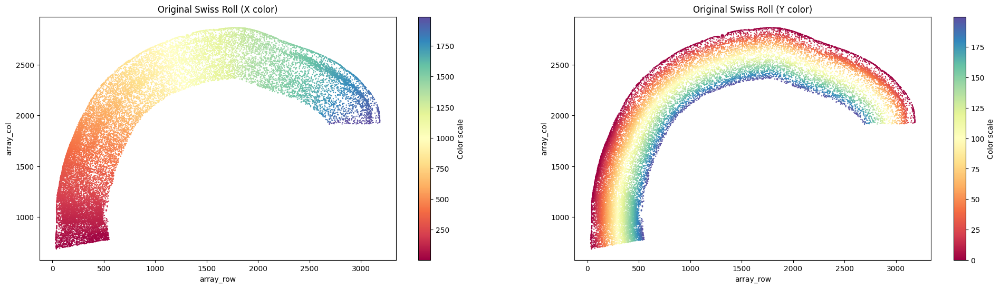

In [12]:
final_result_mousebrain = final_result_mousebrain[(final_result_mousebrain['x_flattened'] > 0) & 
                                                  (final_result_mousebrain['x_flattened'] < final_result_mousebrain['x_flattened'].max()) & 
                                                  (final_result_mousebrain['y_flattened'] < 200)]

su.plot_final_result(final_result_mousebrain)

As mentioned earlier, some datasets require using a relative distance for the y-axis, where each cell must be connected to another cell, resulting in a one-by-one distance to the x-axis. Although the mouse brain data definitely requires this, we can still use it as a demonstration.

### su.y_axis_circle()

`y_axis_circle(x_axis, cells, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], selected=None, n_neighbors_first=18, n_neighbors_rest=7, distance_cutoff=23, center=None, outside=True, max_iter=1000), unit=5, resolution=2, spatial_name = ['array_row', 'array_col'])`

Here, we use a relative distance, where each cell must be connected to another cell, resulting in a one-by-one distance to the x-axis.

1. `x_axis`: Input your x_axis_results.
2. `cells`: Input your cells for y-axis unrolling.
3. `delete_xaxis`: Input your delete_xaxis if you have any. (see mouse small intestine example for details.)
4. `selected`: Input the cells selected for the x-axis. For these cells, the layer value will automatically be set to 0.
5. `n_neighbors_first`: The number of neighbors used when starting to connect cells to the x-axis.
6. `n_neighbors_rest`: The number of neighbors for the remaining cells when connecting them.
7. `distance_cutoff`: The distance cutoff for considering cells as connected to the x-axis and between cells.
8. `center` and `outside`: Since many circular datasets have a center, we can only extend in one direction. If there is no such center, you don't need to input this parameter. Therefore, we provide an option for specifying the center. If y needs to extend outward, set `outside` = `True`; if it needs to extend inward, set it to `False`.
9. `max_iter`: The maximum number of iterations for the process.
10. `unit`: Input a unit value representing how many µm it corresponds to on the x-axis. 
11. `resolution`: Input resolution of sequencing tech, for VisuimHD is 2 um.
12. `spatial_name`: A list of two strings specifying the names of the columns in `adata.obs` that contain the spatial coordinates. Defaults to `['array_row', 'array_col']` from SMURF soft segmentation.


The output of this function is a pandas array of the cells and their information. You can directly concatenate it to adata.obs if desired.

80it [00:44,  1.80it/s, Layer=79] 


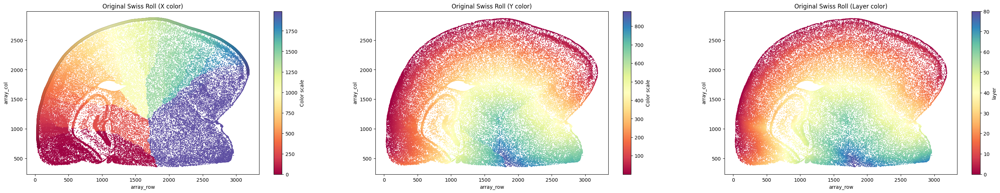

In [13]:
final_result_mousebrain_circle = su.y_axis_circle(x_axis_results_mousebrain, cells_mousebrain, selected = selected_mousebrain, 
                                                  n_neighbors_first = 16, n_neighbors_rest = 20, distance_cutoff = 100, center = None, 
                                                  outside = True, max_iter = 1000)

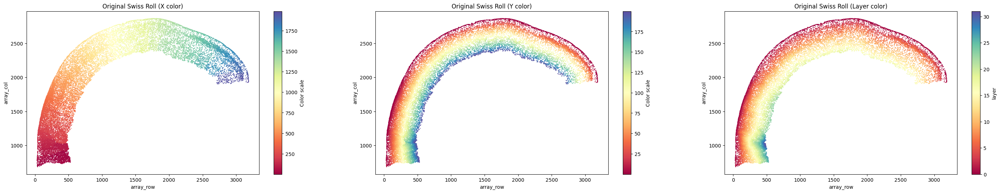

In [14]:
final_result_mousebrain_circle = final_result_mousebrain_circle[(final_result_mousebrain_circle['x_flattened'] > 0) & 
                                 (final_result_mousebrain_circle['x_flattened'] < final_result_mousebrain_circle['x_flattened'].max()) & 
                                 (final_result_mousebrain_circle['y_flattened'] < 200)]

su.plot_final_result(final_result_mousebrain_circle)

### Another version

In the previous example, we used MouseBrain’s outliner to perform unrolling. Additionally, we could explore using Cortex’s bottom functionality. Below are some example code snippets:

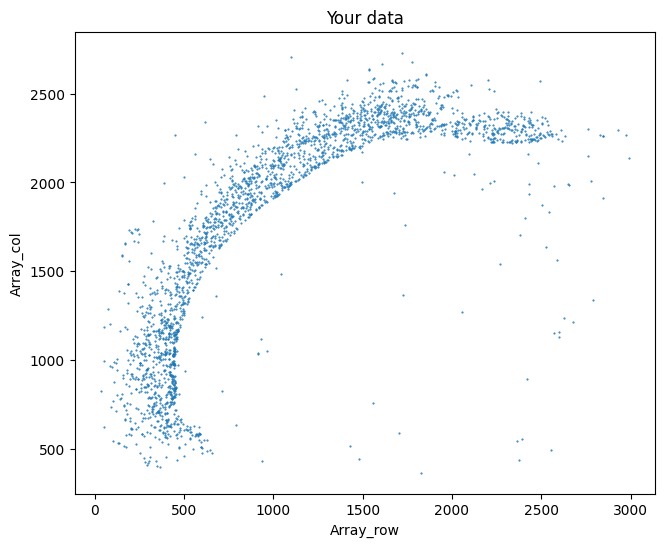

In [15]:
selected_mousebrain2 = su.select_cells(adata_sc_final_mousebrain, [5], cluster_name = 'cell_cluster')
su.plot_selected(selected_mousebrain2)

### su.select_boundary()

`su.select_boundary(selected, alpha = None, auto_alpha_quantile = 80, dedup_tol = 1e-7, ratio = None, show_plot = True)`

We use this function to grab the boundary of selected cells.

1. `selected`: Please input your selected data.
2. `alpha`: Concave-hull (alpha-shape) tightness. Larger means tighter boundary. If `None`, auto-estimated from Delaunay triangle circumradii.
3. `auto_alpha_quantile`: Quantile used when `alpha=None`. Raise this value (e.g., 85–90) for a tighter, more detailed boundary; lower for smoother.
4. `dedup_tol`:  Input your data that is part of the x-axis but not included in the x-axis results (see the small intestine example).

The output of this function is the cells of the boundary of selected cells.

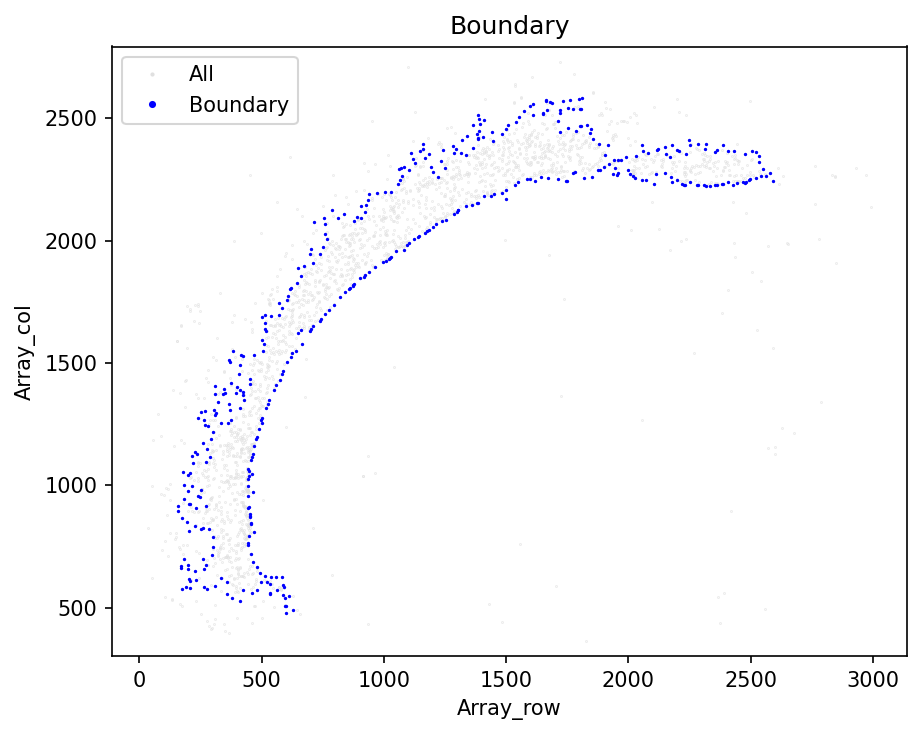

In [16]:
selected_mousebrain2 = su.select_boundary(selected_mousebrain2)

Next, we pinpoint the specific layer we intend to unroll. I perform `su.clean_select` multiple times to prepare the best data for x-axis analysis.

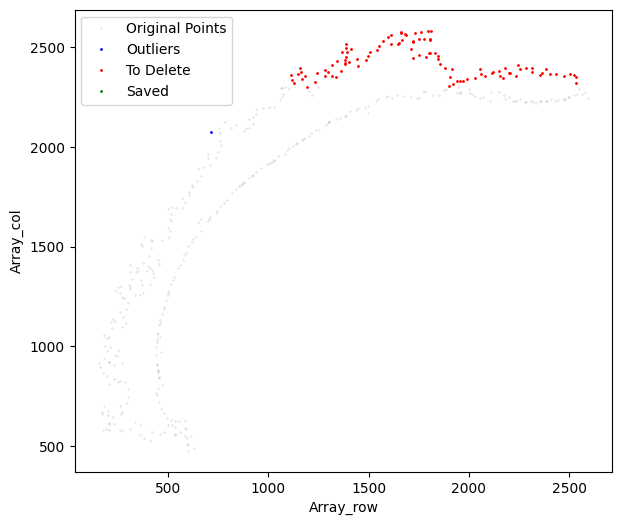

In [17]:
selected_mousebrain2 = su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                       down=2300, up = 2600, left=0, right=3000, return_deleted=False, outlier_cutoff = 60, 
                                       outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

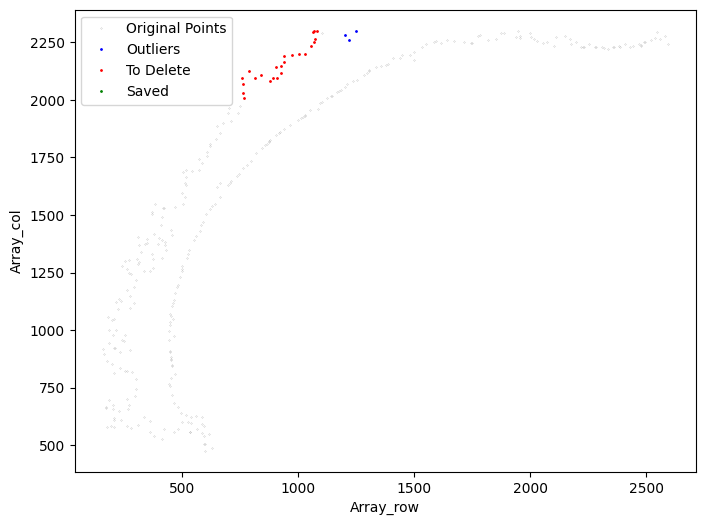

In [18]:
selected_mousebrain2 =  su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                        down=2000, up = 2600, left=0, right=1100, return_deleted=False, outlier_cutoff = 60, 
                                        outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

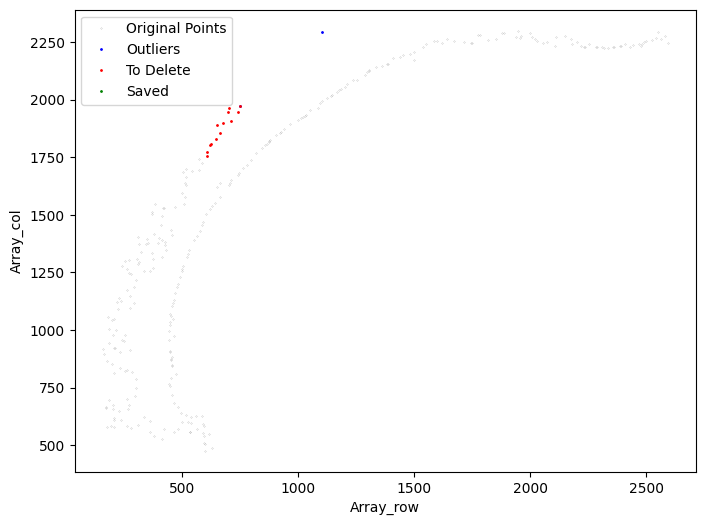

In [19]:
selected_mousebrain2 = su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                       down=1750, up = 2600, left=0, right=800, return_deleted=False, 
                                       outlier_cutoff = 60, outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

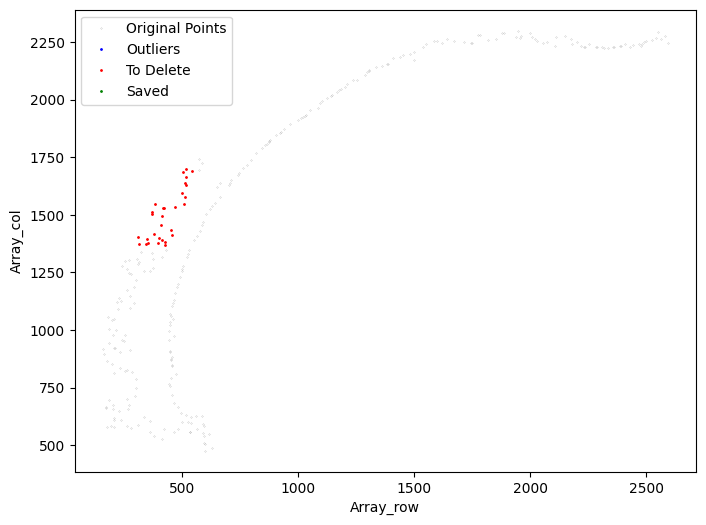

In [20]:
selected_mousebrain2 = su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                       down=1350, up = 2600, left=0, right=550, return_deleted=False, 
                                       outlier_cutoff = 60, outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

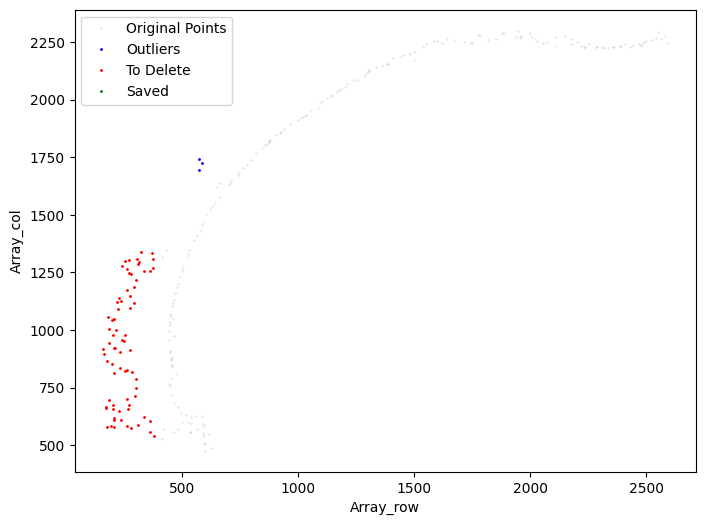

In [21]:
selected_mousebrain2 = su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                       right=400, return_deleted=False, outlier_cutoff = 60, 
                                       outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

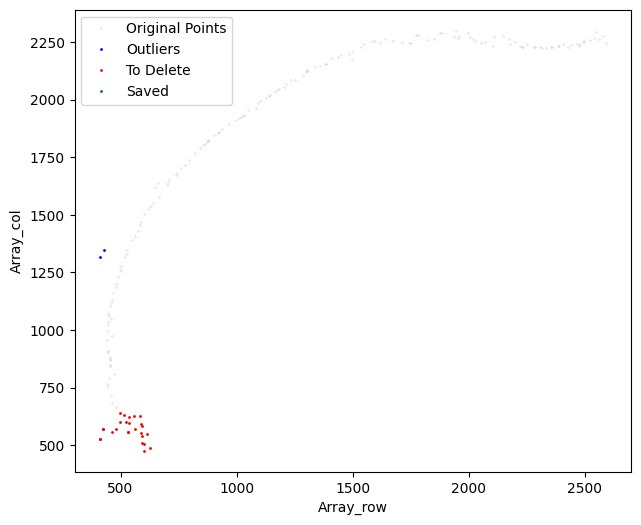

In [22]:
selected_mousebrain2 = su.clean_select(selected_mousebrain2, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))],
                                       down=0, up = 650, return_deleted=False, outlier_cutoff = 60, 
                                       outlier_neighbors =5, k_neighbors=40, avg_iterations=4)

Next, we begin constructing the x-axis.

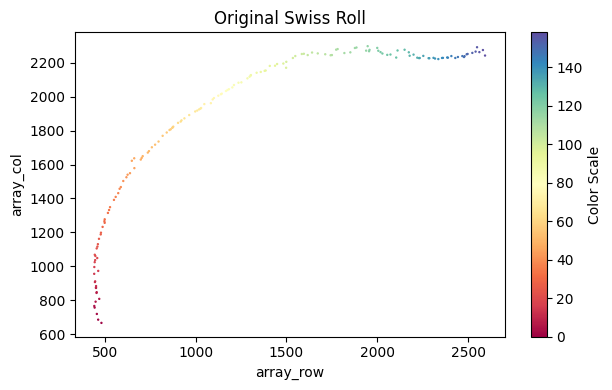

In [23]:
su.x_axis_pre(selected_mousebrain2, 42)

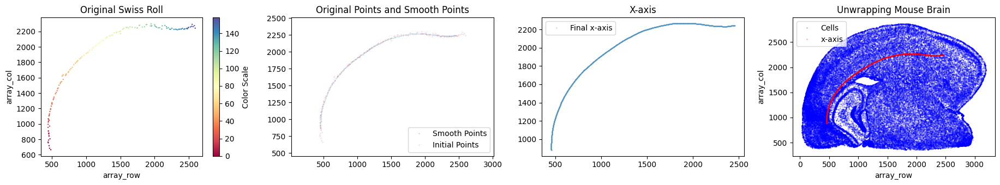

One unit length on the x-axis is 5.00 μm. The total x-axis length is 0.5542 cm.


In [24]:
x_axis_results_mousebrain2 = su.x_axis(selected_mousebrain2, adata_sc_final_mousebrain, num_avg=20)

In [25]:
cells_mousebrain2 = su.select_rest_cells(adata_sc_final_mousebrain, selected_mousebrain2)

Next, we define the Y-axis and use the `center` as a pivot to control its orientation. The direction from each cell to the x-axis must match the direction from the cell to the `center`. Please select the appropriate `center` to meet this requirement.

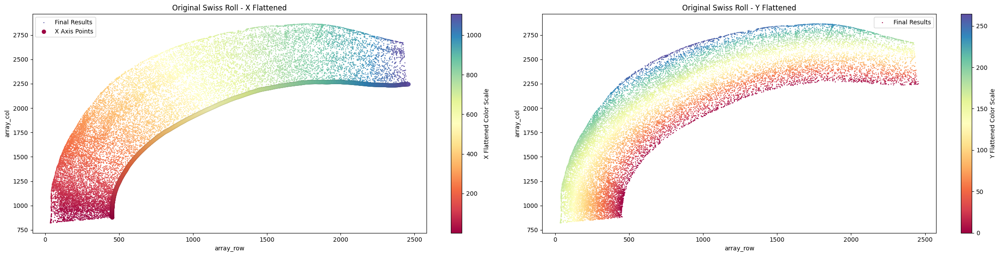

In [26]:
final_result_mousebrain2 = su.y_axis(x_axis_results_mousebrain2, cells_mousebrain2, selected_mousebrain2, 
                                    center = np.array([3000,200]), delete_residues = True )

To better understand the role of `center`, we remove it to observe the differences.

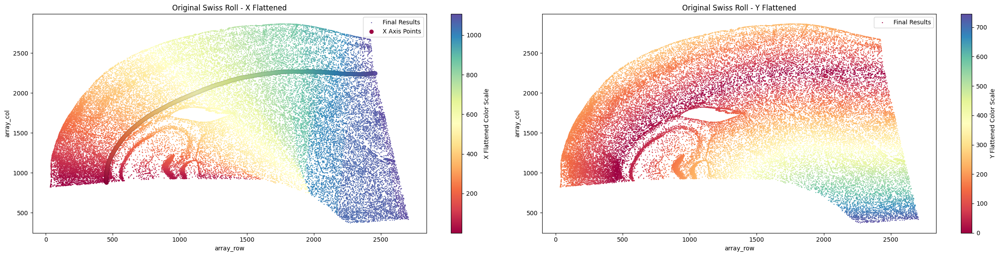

In [27]:
final_result_mousebrain2 = su.y_axis(x_axis_results_mousebrain2, cells_mousebrain2, selected_mousebrain2, delete_residues = True)

# Unrolling Mouse Small Intestine Data

Let's first start with the Mouse Small Intestine example.

Like previously, we will introduce the steps in this example:

1. Use [su.select_cells()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.select_cells()) to select the cells from the boundary cluster for the x-axis.
2. Use [su.clean_select()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.clean_select()) to clean the selected data.
3. Use [su.x_axis()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.x_axis()-and-su.x_axis_pre()) to build the x-axis.
4. Use [su.select_rest_cells()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.select_rest_cells()) to find all remaining cells for the y-axis.
5. Use [su.y_axis_circle()](https://the-mitra-lab.github.io/SMURF/tutorials/notebooks/unroll_example.html#su.y_axis_circle()) to get the final results. Note that thiis step is different from previous example as we do not use direct distance for unrolling y axis.

In the meantime, we can use `su.plot_selected()` to view our data and `su.plot_final_result()` to take a look at the final results.

To download the final result directly:
``` python
! wget https://github.com/The-Mitra-Lab/SMURF/releases/download/datasets/adata_sc_final_smallintestine.h5ad.gz
! gunzip adata_sc_final_smallintestine.h5ad.gz 
```

In [28]:
#! wget https://github.com/The-Mitra-Lab/SMURF/releases/download/datasets/adata_sc_final_smallintestine.h5ad.gz
#! gunzip adata_sc_final_smallintestine.h5ad.gz 

In [29]:
adata_sc_final_smallintestine =  sc.read_h5ad('adata_sc_final_smallintestine.h5ad')
adata_sc_final_smallintestine

AnnData object with n_obs × n_vars = 403266 × 19059
    obs: 'cell_cluster', 'cos_simularity', 'cell_size', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types'
    uns: 'spatial'
    obsm: 'spatial'

## [su.select_cells()](#select_cells())

Here, we select clusters 24 and 26 for unrolling the x-axis. Actually, they represent muscle cells and neural cells.

In [30]:
selected_smallintestine = su.select_cells(adata_sc_final_smallintestine, [6, 23], cluster_name = 'cell_cluster')

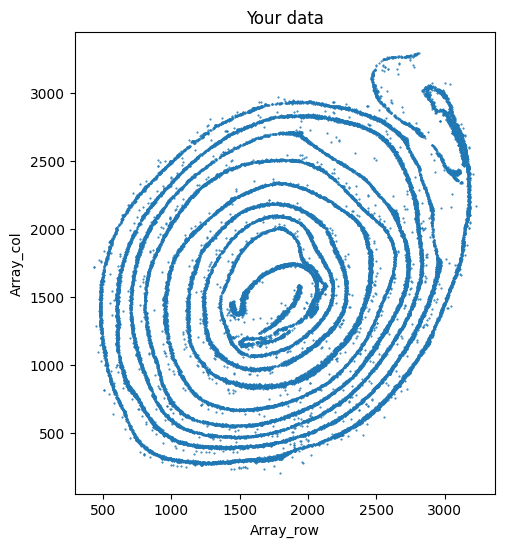

In [31]:
su.plot_selected(selected_smallintestine)

## [su.clean_select()](#su.clean_select())

For these analysis please do:

```python
su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], save_area = [0,400,600,400],
                return_deleted=False, outlier_cutoff = 12, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)
```
first. Then do:

```python
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, outlier_cutoff = 12, 
                                          outlier_neighbors =4, k_neighbors=40, avg_iterations=2)
```

You can always perform this multiple times to prepare the best data for x-axis analysis. (like this example)

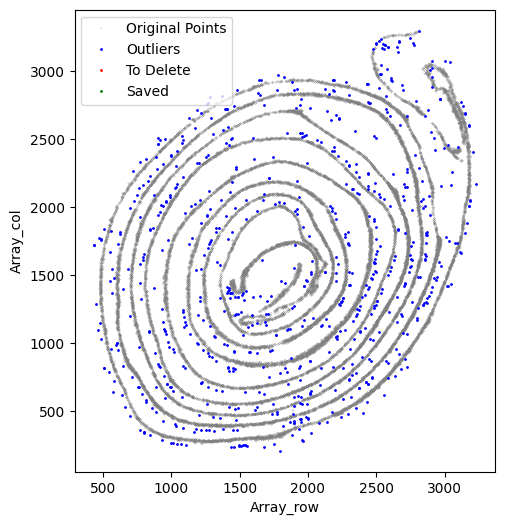

In [32]:
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, 
                                          outlier_cutoff = 12, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)

It is normal to perform this process several times.

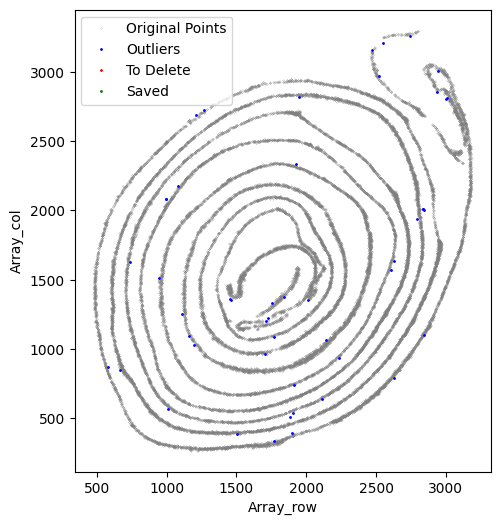

In [33]:
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, 
                                          outlier_cutoff = 11, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)

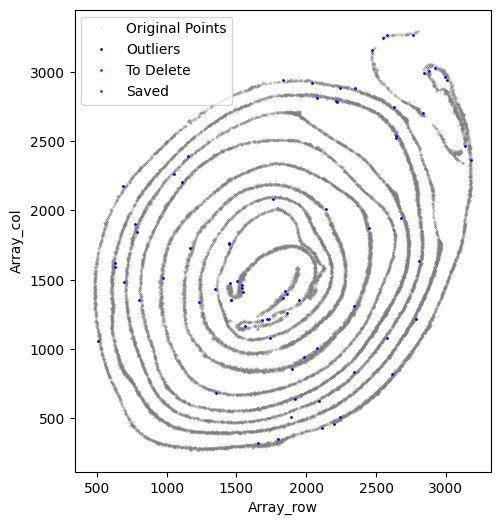

In [34]:
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, 
                                          outlier_cutoff = 10, outlier_neighbors =4, k_neighbors=40, avg_iterations=2)

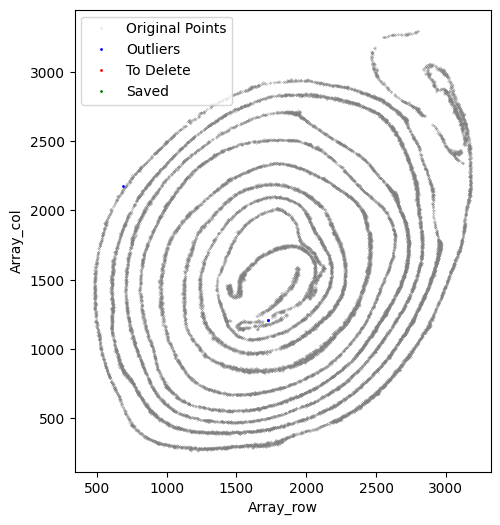

In [35]:
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, 
                                          outlier_cutoff = 12, outlier_neighbors =4, k_neighbors=40, avg_iterations=1)

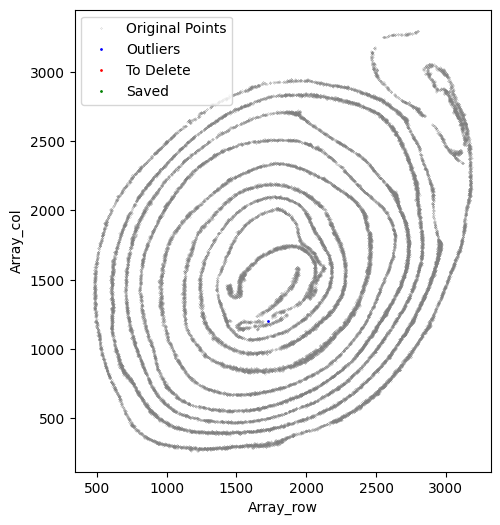

In [36]:
selected_smallintestine = su.clean_select(selected_smallintestine, delete_xaxis=[[np.zeros((0, 1))], np.zeros((0, 2))], 
                                          save_area = [0,400,600,400], return_deleted=False, 
                                          outlier_cutoff = 12, outlier_neighbors =4, k_neighbors=40, avg_iterations=1)

## Facing issues with broken tissues.

Now, we make sure that all the selected cells should be part of the x-axis, and we would like to perform an x-axis preview analysis. We found that, regardless of the parameters used, we do not get good results at the beginning and end regions. The reason is due to tissue overlap and damage in these areas. At this point, we need to manually remove these regions. Note that, since these deleted parts still belong to the x-axis but are outside of our analyzable range, we still need to save them and not include them in the subsequent y-axis analysis. Please refer to the following example section for specific usage.

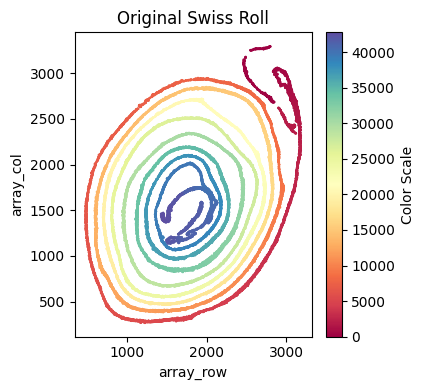

In [37]:
su.x_axis_pre(selected_smallintestine, seed=42, n_neighbors=20)

Start preserving the deleted data. Remember, **do not assign values** to the data until you have confirmed the function parameters.

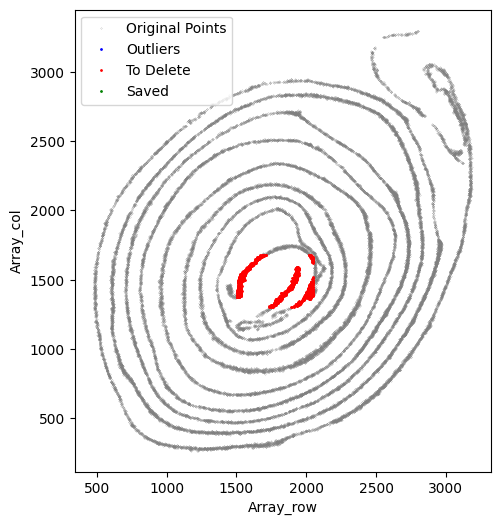

In [38]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1680, down = 1300, left = 1500, right = 2050, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, return_deleted = True)

**After you have the first `to_delete`, remember to input `to_delete` in the function input. Do this function as many time as you need.**

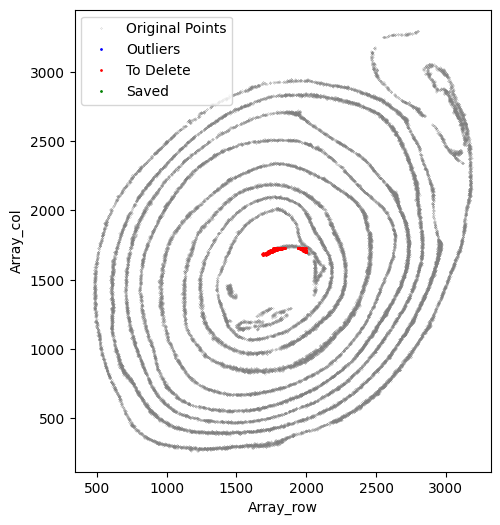

In [39]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1730, down = 1300, left = 1500, right = 2000, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

Please clean your data as many times as you want.

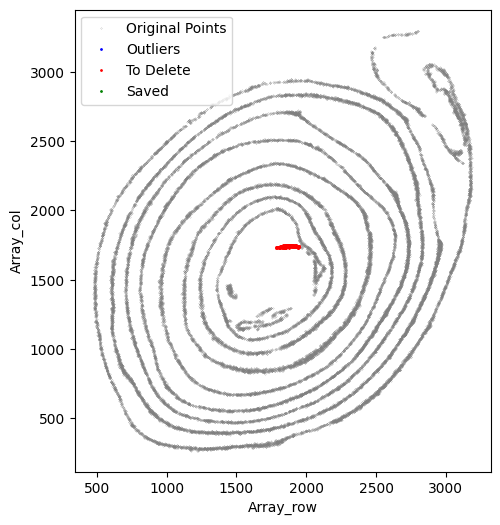

In [40]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1780, down = 1300, left = 1600, right = 1950, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

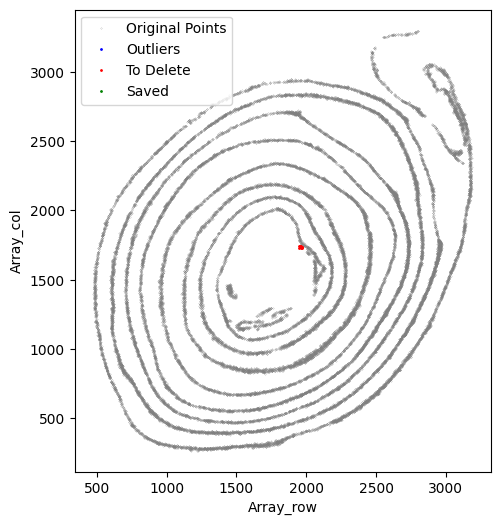

In [41]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1750, down = 1300, left = 1600, right = 1970, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

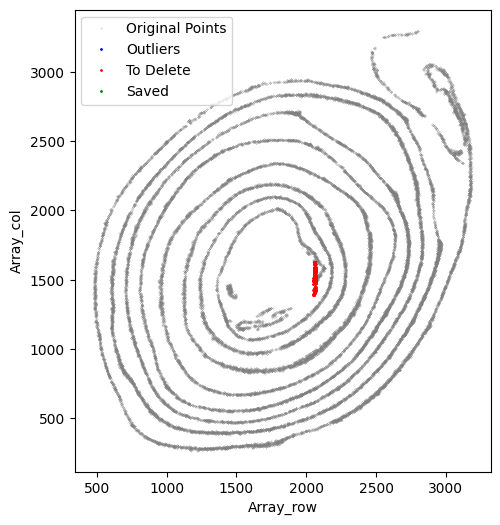

In [42]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1630, down = 1340, left = 1610, right = 2070, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

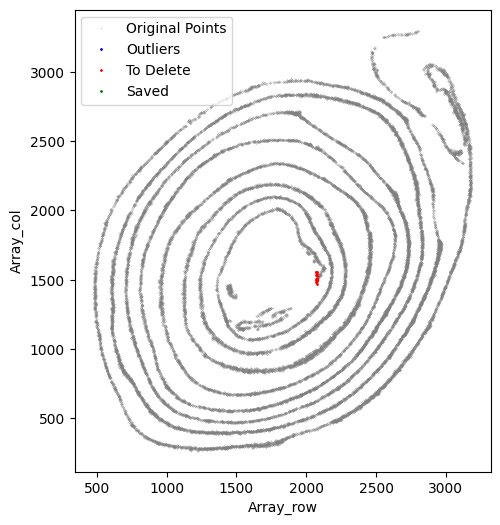

In [43]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1620, down = 1340, left = 1610, right = 2080, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

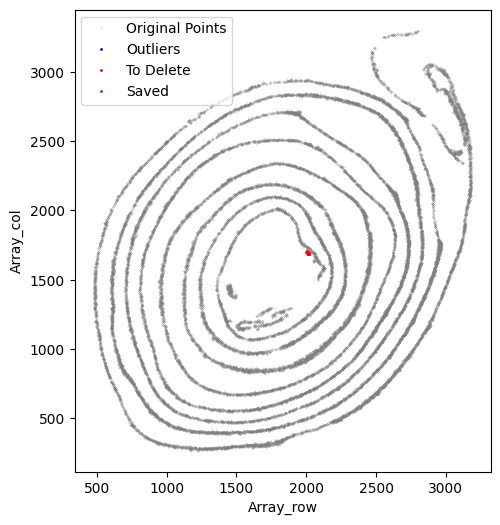

In [44]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1720, down = 1340, left = 1610, right = 2019, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

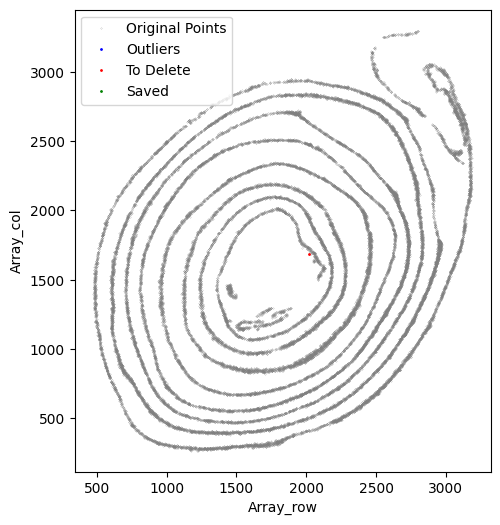

In [45]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1710, down = 1340, left = 1610, right = 2020, 
                                                    outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

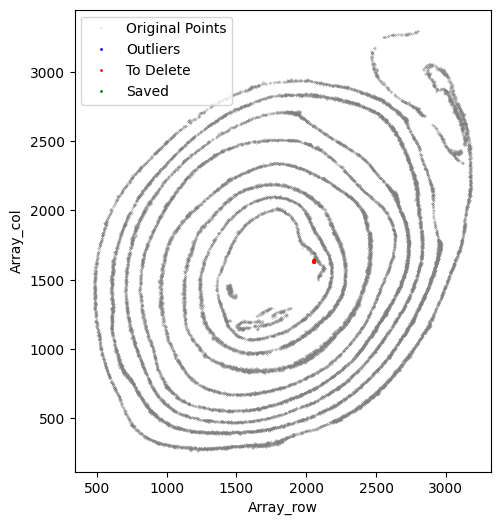

In [46]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1650, down = 1340, left = 1610, right = 2060, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

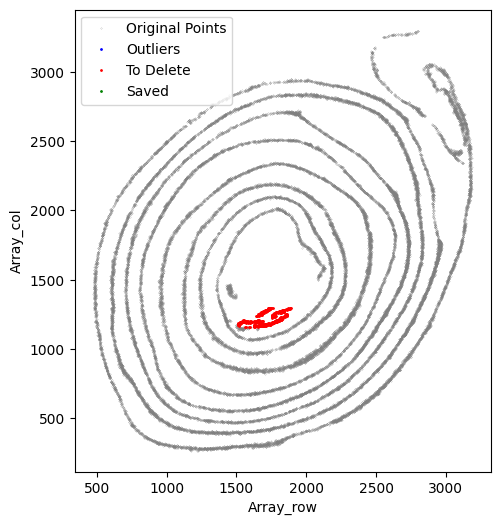

In [47]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1780, down = 1160, left = 1510, right = 1890, 
                                                     outlier_cutoff = 50, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

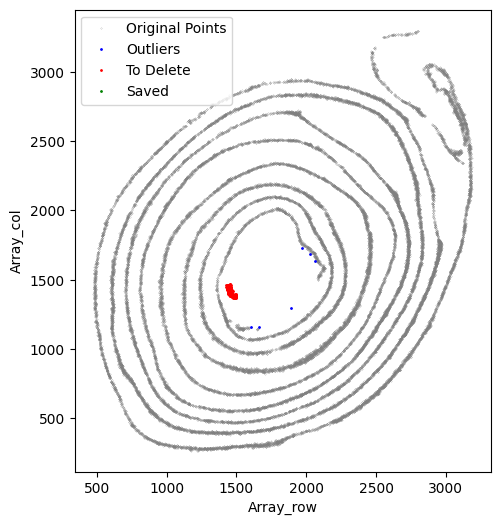

In [48]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1580, down = 1360, left = 1410, right = 1890, 
                                                     outlier_cutoff = 15, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

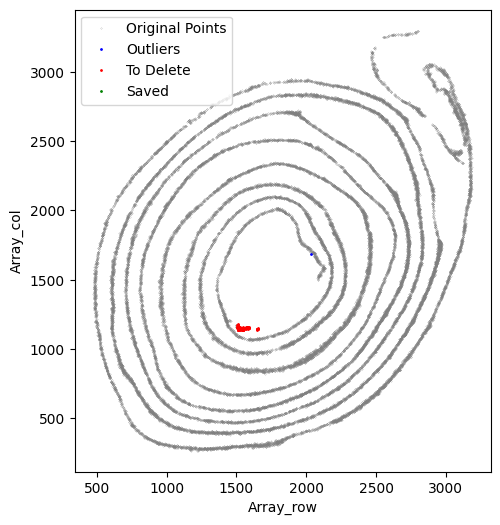

In [49]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1580, down = 1110, left = 1500, right = 1750, 
                                                     outlier_cutoff = 15, outlier_neighbors =5, delete_xaxis=to_delete, return_deleted = True)

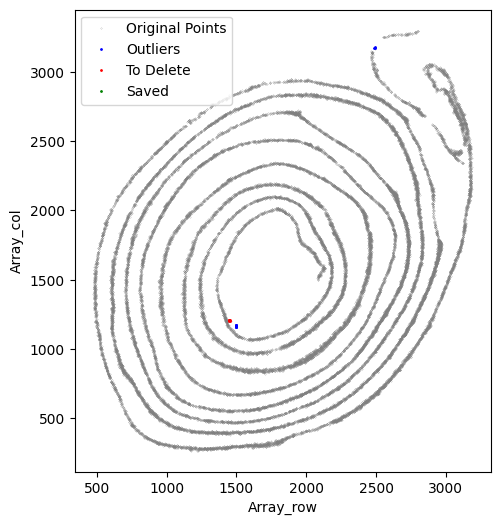

In [50]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, up = 1580, down = 1200, left = 1440, right = 1490, 
                                                     outlier_cutoff = 18, outlier_neighbors =10, delete_xaxis=to_delete, return_deleted = True,
                                                     k_neighbors=40, avg_iterations=1)

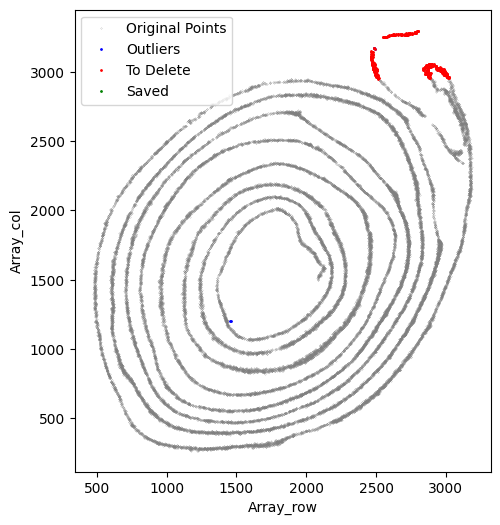

In [51]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, down = 2950,outlier_cutoff = 18, outlier_neighbors =10, 
                                                     delete_xaxis=to_delete, return_deleted = True,
                                                     k_neighbors=40, avg_iterations=1)

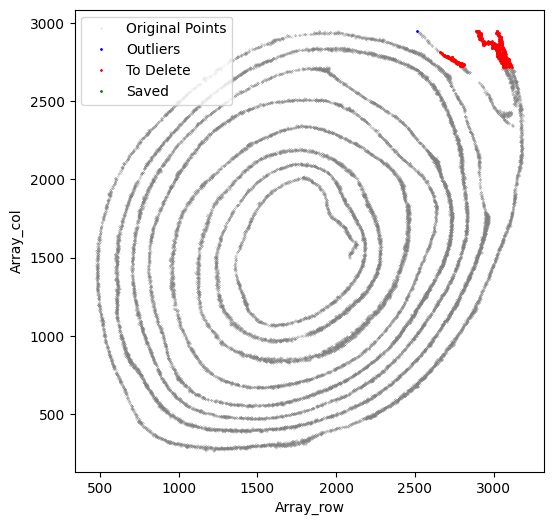

In [52]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, down = 2720, left = 2660, outlier_cutoff = 18, outlier_neighbors =10, return_deleted = True,
                                     delete_xaxis=to_delete, k_neighbors=40, avg_iterations=1)

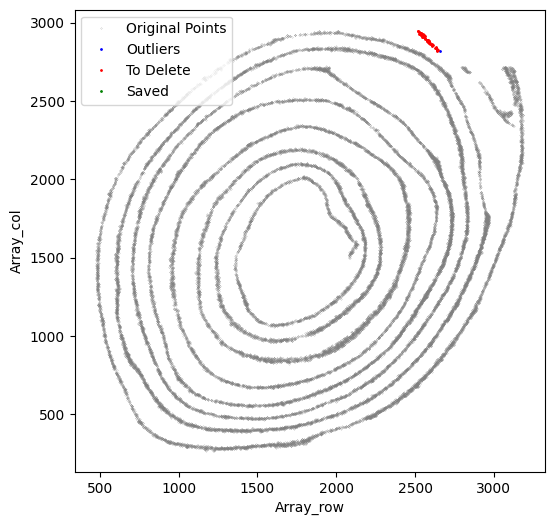

In [53]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, down = 2820, left = 2500, 
                                                     outlier_cutoff = 18, outlier_neighbors =10, return_deleted = True,
                                                     delete_xaxis=to_delete, k_neighbors=40, avg_iterations=1)

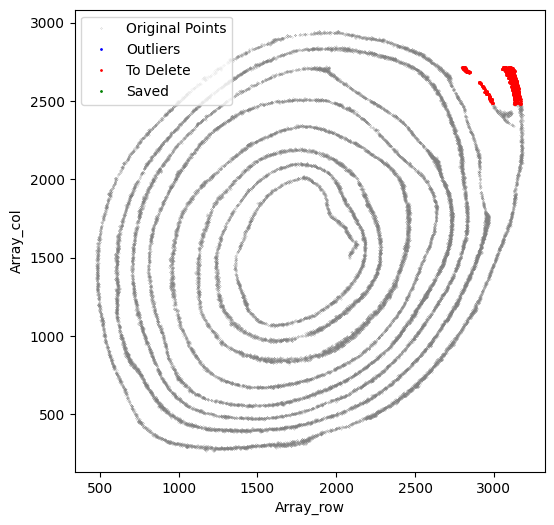

In [54]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, down = 2480, left = 2800,  
                                                     outlier_cutoff = 18, outlier_neighbors =10, return_deleted = True,
                                                     delete_xaxis=to_delete, k_neighbors=40, avg_iterations=1)

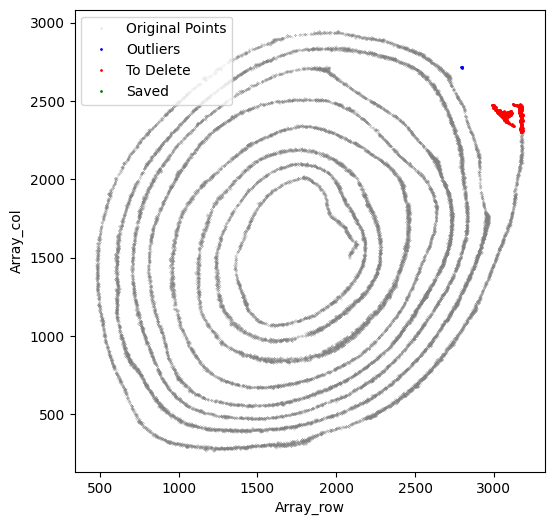

In [55]:
selected_smallintestine, to_delete = su.clean_select(selected_smallintestine, down = 2300, left = 2900,  
                                                     outlier_cutoff = 18, outlier_neighbors =10, return_deleted = True,
                                                     delete_xaxis=to_delete, k_neighbors=40, avg_iterations=1)

Try `su.x_axis_pre`; it's now perfect!

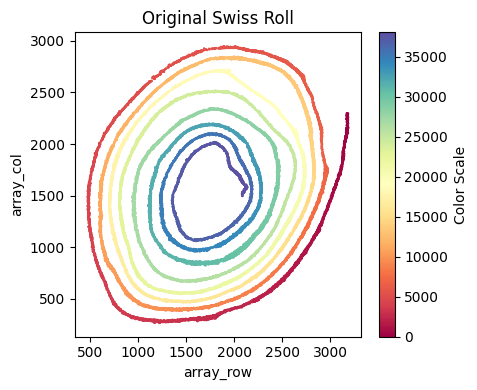

In [56]:
su.x_axis_pre(selected_smallintestine, seed=42, n_neighbors=30)

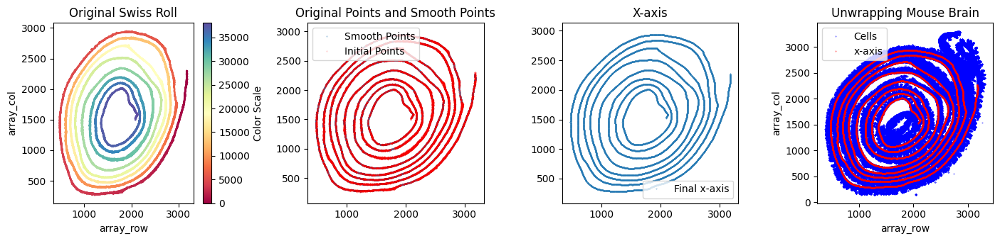

One unit length on the x-axis is 5.00 μm. The total x-axis length is 9.0145 cm.


In [57]:
x_axis_results_smallintestine = su.x_axis(selected_smallintestine, 
                                          adata=adata_sc_final_smallintestine, 
                                          seed=42, n_neighbors=30)

Get the rest of the cells for y-axis analysis with [`su.select_rest_cells()`](#select_rest_cells)

In [58]:
cells_smallintestine = su.select_rest_cells(adata_sc_final_smallintestine, selected_smallintestine, to_delete )

Get final data data by [`su.y_axis_circle()`](#y_axis_circle)

Note that `center` and `outside`: Since many circular datasets have a center, we can only extend in one direction. If there is no such center, you don't need to input this parameter. Therefore, we provide an option for specifying the center. If y needs to extend outward, set `outside` = `True`; if it needs to extend inward, set it to `False`. If you're interested, you can see what the result looks like without inputting this parameter here.

133it [35:50, 16.17s/it, Layer=132]


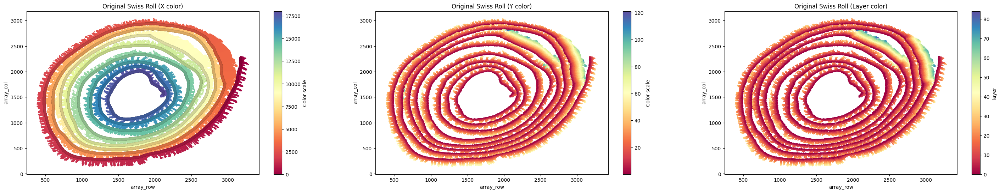

In [59]:
final_result_smallintestine = su.y_axis_circle(x_axis_results_smallintestine, cells_smallintestine, to_delete, 
                                               selected_smallintestine, n_neighbors_first = 18, n_neighbors_rest = 7, 
                                               distance_cutoff = 23, center = np.array([1750,1600]), outside = True)